In [158]:
from astropy.io import fits
import numpy as np
from matplotlib import pyplot as plt
from glob import glob
from astropy.wcs import WCS
from astropy.visualization import make_lupton_rgb

from photutils.detection import DAOStarFinder
from photutils.aperture import aperture_photometry, CircularAperture, CircularAnnulus
from astropy.stats import mad_std
from astropy.timeseries import LombScargle
from photutils.centroids import centroid_sources, centroid_com

import pandas as pd
import matplotlib.dates as mdates

np.set_printoptions(legacy='1.25')

# M91

## M91 Bias

In [178]:
m91_bias = glob('Astro_analysis_data/IAC80_M91/bias/*.fits')
#print(m91_bias)

(2048, 2098)


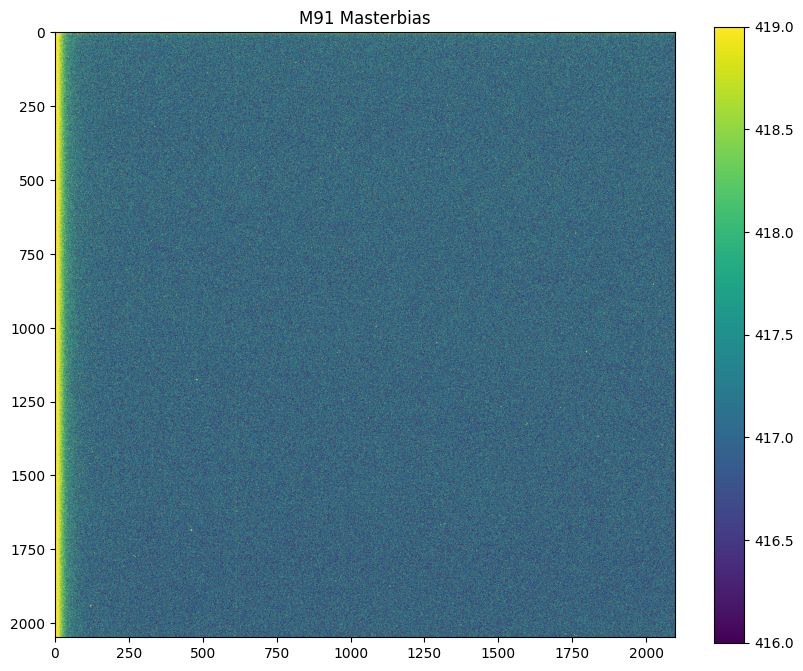

In [194]:
m91_bias_data = np.stack([fits.getdata(f).astype(float) for f in m91_bias], axis=0)

m91_masterbias = np.mean(m91_bias_data, axis=0)
print(np.shape(m91_masterbias))

plt.figure(figsize=(10,8))
plt.imshow(m91_masterbias, cmap='viridis', vmin=416, vmax=419)
plt.colorbar()
plt.title('M91 Masterbias')
plt.show()

## M91 Flat

In [179]:
m91_flat_B = glob('Astro_analysis_data/IAC80_M91/flats/B/*.fits')
#print(m91_flat_B)

In [6]:
m91_flat_B_data = []
for f in m91_flat_B:
    dataf_B = fits.getdata(f).astype(float)
    datafb_B = dataf_B - m91_masterbias
    m91_flat_B_data.append(datafb_B)

m91_flat_B_data = np.stack(m91_flat_B_data, axis=0)
m91_masterflat_B = np.mean(m91_flat_B_data, axis=0)
print(np.shape(m91_masterflat_B))

(2048, 2098)


1.0000002033795865


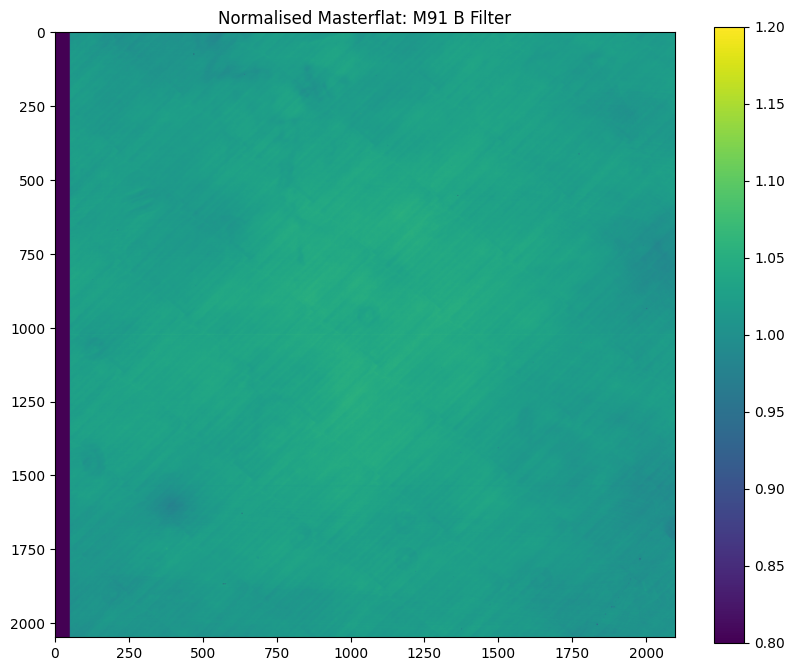

In [195]:
m91_B_normalised = m91_masterflat_B / np.mean(m91_masterflat_B)
m91_B_normalised = np.clip(m91_B_normalised, 1e-6, None)
print(np.mean(m91_B_normalised))

plt.figure(figsize=(10,8))
plt.imshow(m91_B_normalised, cmap='viridis', vmin=0.8, vmax=1.2)
plt.colorbar()
plt.title('Normalised Masterflat: M91 B Filter')

plt.show()

In [180]:
m91_flat_Ha = glob('Astro_analysis_data/IAC80_M91/flats/Halpha_NII/*.fits')
#print(m91_flat_Ha)

In [9]:
m91_flat_Ha_data = []
for f in m91_flat_Ha:
    dataf_Ha = fits.getdata(f).astype(float)
    datafb_Ha = dataf_Ha - m91_masterbias
    m91_flat_Ha_data.append(datafb_Ha)

m91_flat_Ha_data = np.stack(m91_flat_Ha_data, axis=0)
m91_masterflat_Ha = np.mean(m91_flat_Ha_data, axis=0)
print(np.shape(m91_masterflat_Ha))

(2048, 2098)


1.0000002844649576


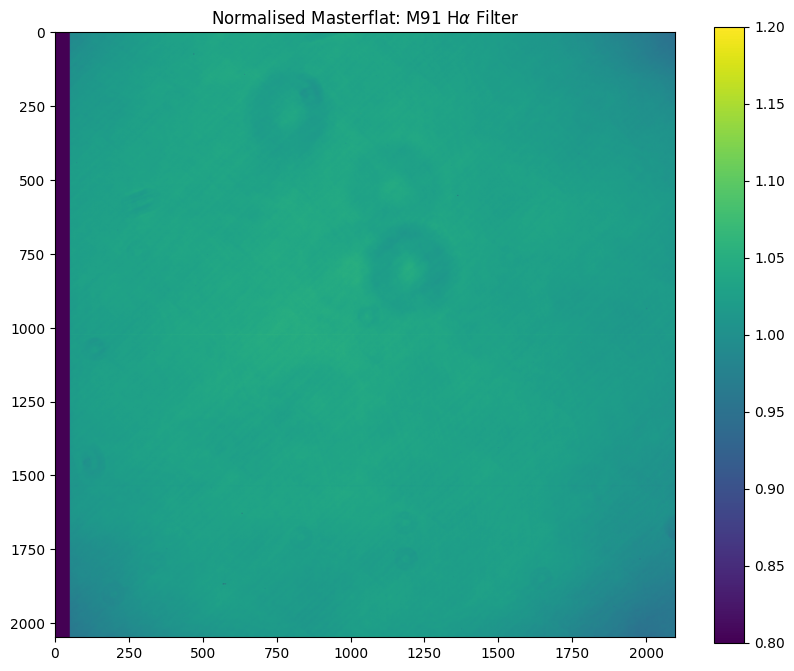

In [196]:
m91_Ha_normalised = m91_masterflat_Ha / np.mean(m91_masterflat_Ha)
m91_Ha_normalised = np.clip(m91_Ha_normalised, 1e-6, None)
print(np.mean(m91_Ha_normalised))

plt.figure(figsize=(10,8))
plt.imshow(m91_Ha_normalised, cmap='viridis', vmin=0.8, vmax=1.2)
plt.colorbar()
plt.title(r'Normalised Masterflat: M91 H$\alpha$ Filter')

plt.show()

In [181]:
m91_flat_V = glob('Astro_analysis_data/IAC80_M91/flats/V/*.fits')
#print(m91_flat_V)

In [12]:
m91_flat_V_data = []
for f in m91_flat_V:
    dataf_V = fits.getdata(f).astype(float)
    datafb_V = dataf_V - m91_masterbias
    m91_flat_V_data.append(datafb_V)

m91_flat_V_data = np.stack(m91_flat_V_data, axis=0)
m91_masterflat_V = np.mean(m91_flat_V_data, axis=0)
print(np.shape(m91_masterflat_V))

(2048, 2098)


1.0000002049871548


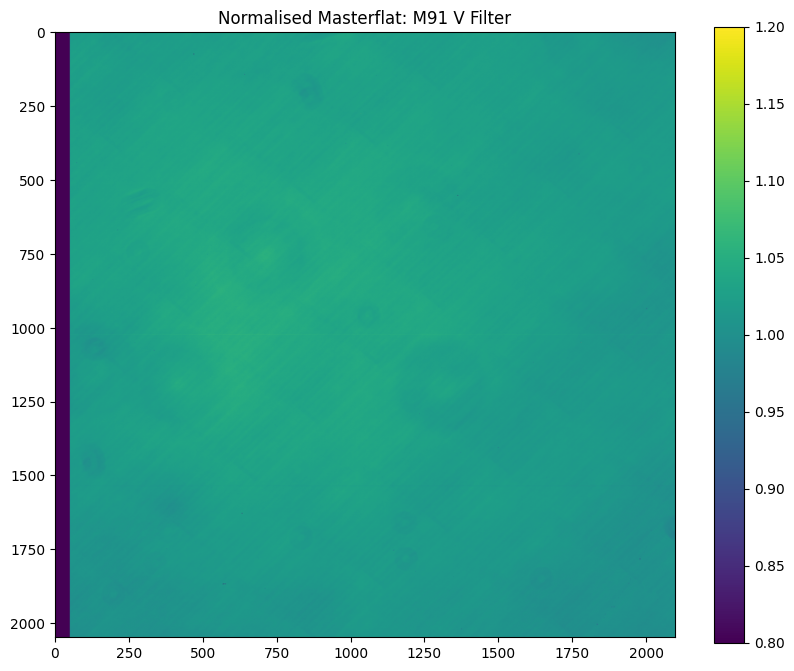

In [197]:
m91_V_normalised = m91_masterflat_V / np.mean(m91_masterflat_V)
m91_V_normalised = np.clip(m91_V_normalised, 1e-6, None)
print(np.mean(m91_V_normalised))

plt.figure(figsize=(10,8))
plt.imshow(m91_V_normalised, cmap='viridis', vmin=0.8, vmax=1.2)
plt.colorbar()
plt.title('Normalised Masterflat: M91 V Filter')

plt.show()

## M91 Object

In [14]:
def deeper_analysis(objfile, masterbias, normalised_flat):
    obj_list = []
    for f in objfile:
        objdata = fits.getdata(f).astype(float)
        corrected = (objdata - masterbias) / normalised_flat
        obj_list.append(corrected)
    
    masterobj = np.mean(np.stack(obj_list, axis=0), axis=0)
    print(np.shape(masterobj))
    
    return masterobj

### B Filter

In [182]:
m91_obj_B = glob('Astro_analysis_data/IAC80_M91/object/B/*.fits')
#print(m91_obj_B)

405 15055


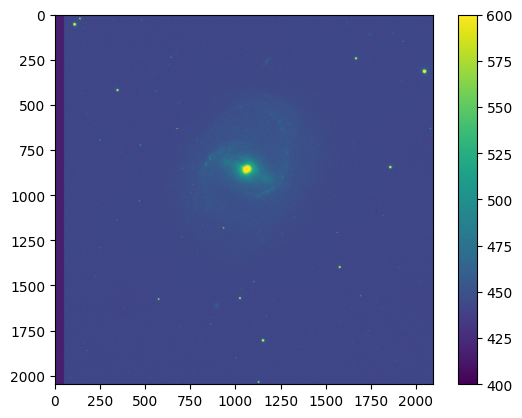

In [16]:
m91_B_test = fits.open('Astro_analysis_data/IAC80_M91/object/B/O130311_0121.fits')
m91_B_testimg = m91_B_test[0].data
print(np.min(m91_B_testimg), np.max(m91_B_testimg))

plt.imshow(m91_B_testimg, cmap='viridis', vmin=400, vmax=600)
plt.colorbar()

plt.show()

(2048, 2098)


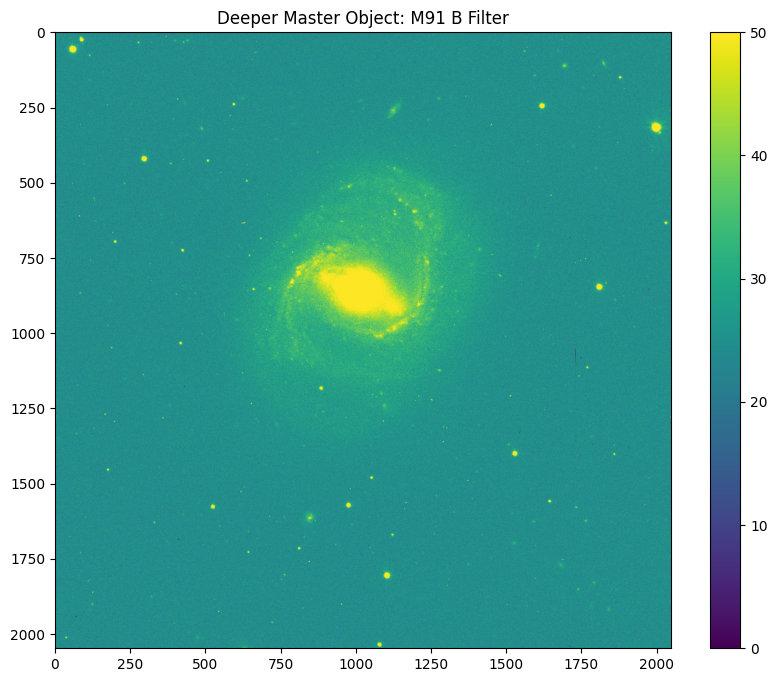

In [198]:
masterobj_B = deeper_analysis(m91_obj_B, m91_masterbias, m91_B_normalised)[:, 50:]

plt.figure(figsize=(10,8))
plt.imshow(masterobj_B, cmap='viridis', vmin=0, vmax=50)
plt.colorbar()
plt.title('Deeper Master Object: M91 B Filter')

plt.show()

### H⍺ Filter

In [183]:
m91_obj_Ha = glob('Astro_analysis_data/IAC80_M91/object/Halpha_NII/*.fits')
#print(m91_obj_Ha)

404 13051


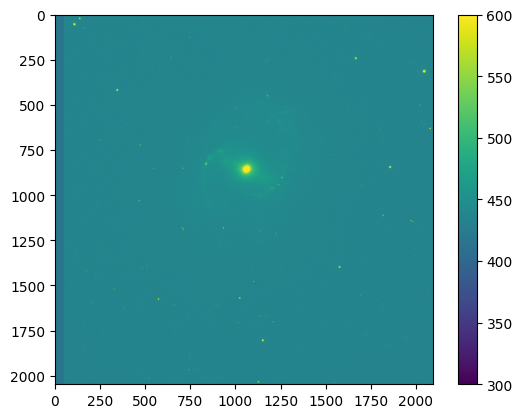

In [184]:
m91_Ha_test = fits.open('Astro_analysis_data/IAC80_M91/object/Halpha_NII/O130311_0117.fits')
m91_Ha_testimg = m91_Ha_test[0].data
print(np.min(m91_Ha_testimg), np.max(m91_Ha_testimg))

plt.imshow(m91_Ha_testimg, cmap='viridis', vmin=300, vmax=600)
plt.colorbar()
"""plt.xlim(1000,1200)
plt.ylim(800,1000)"""

plt.show()

(2048, 2098)


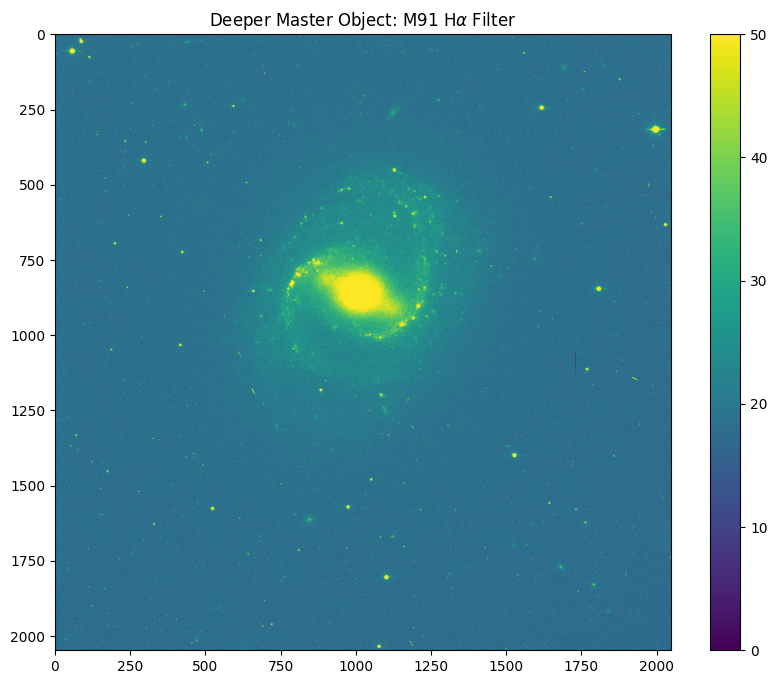

In [199]:
masterobj_Ha = deeper_analysis(m91_obj_Ha, m91_masterbias, m91_Ha_normalised)[:, 50:]

plt.figure(figsize=(10,8))
plt.imshow(masterobj_Ha, cmap='viridis', vmin=0, vmax=50)
plt.colorbar()
plt.title(r'Deeper Master Object: M91 H$\alpha$ Filter')

plt.show()

### V Filter

In [185]:
m91_obj_V = glob('Astro_analysis_data/IAC80_M91/object/V/*.fits')
#print(m91_obj_V)

404 28714


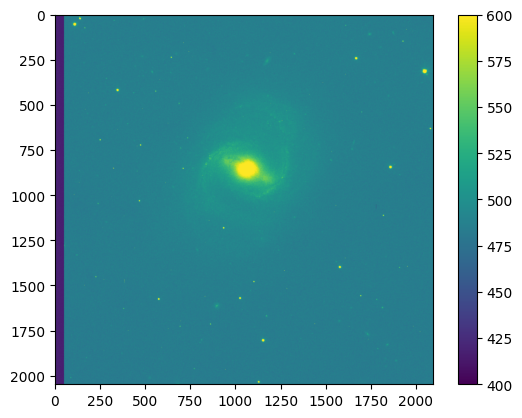

In [186]:
m91_V_test = fits.open('Astro_analysis_data/IAC80_M91/object/V/O130311_0123.fits')
m91_V_testimg = m91_V_test[0].data
print(np.min(m91_V_testimg), np.max(m91_V_testimg))

plt.imshow(m91_V_testimg, cmap='viridis', vmin=400, vmax=600)
plt.colorbar()
"""plt.xlim(1000,1200)
plt.ylim(800,1000)"""

plt.show()

(2048, 2098)


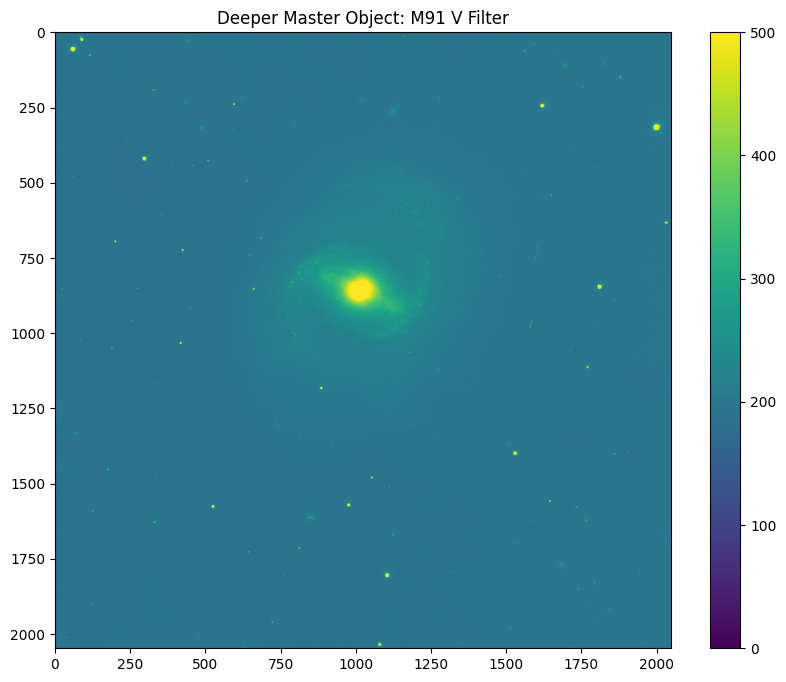

In [200]:
masterobj_V = deeper_analysis(m91_obj_V, m91_masterbias, m91_V_normalised)[:, 50:]

plt.figure(figsize=(10,8))
plt.imshow(masterobj_V, cmap='viridis', vmin=0, vmax=500)
plt.colorbar()
plt.title('Deeper Master Object: M91 V Filter')

plt.show()

## M91 RGB Image

In [24]:
def scaledimg(img):
    clean = np.nan_to_num(img, nan=0.0, posinf=1e6)
    # https://numpy.org/doc/stable/reference/generated/numpy.nan_to_num.html

    clean[clean < 0] = 0
    maxval = np.percentile(clean, 98.5)

    if maxval > 0:
        return clean / maxval
    else:
        return clean

In [187]:
B_scaled = scaledimg(masterobj_B)
Ha_scaled = scaledimg(masterobj_Ha)
V_scaled = scaledimg(masterobj_V)

#print(B_scaled)

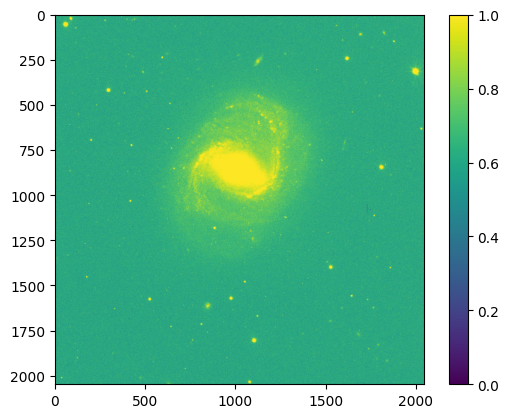

In [26]:
plt.imshow(B_scaled, cmap='viridis', vmin=0, vmax=1)
plt.colorbar()

plt.show()

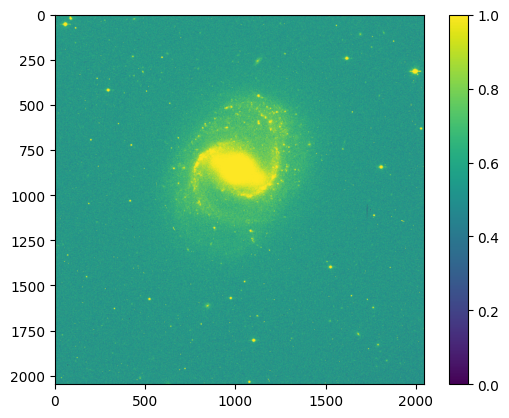

In [27]:
plt.imshow(Ha_scaled, cmap='viridis', vmin=0, vmax=1)
plt.colorbar()

plt.show()

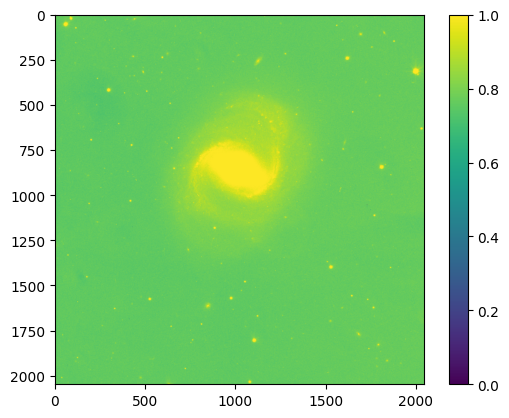

In [28]:
plt.imshow(V_scaled, cmap='viridis', vmin=0, vmax=1)
plt.colorbar()

plt.show()

/Users/JoanaUCD/Library/CloudStorage/OneDrive-UniversityCollegeDublin/Labs/.venv-1/lib/python3.11/site-packages/astropy/visualization/lupton_rgb.py:645: RuntimeWarning: invalid value encountered in divide
  fInorm = np.where(Int <= 0, 0, np.true_divide(fI, Int))


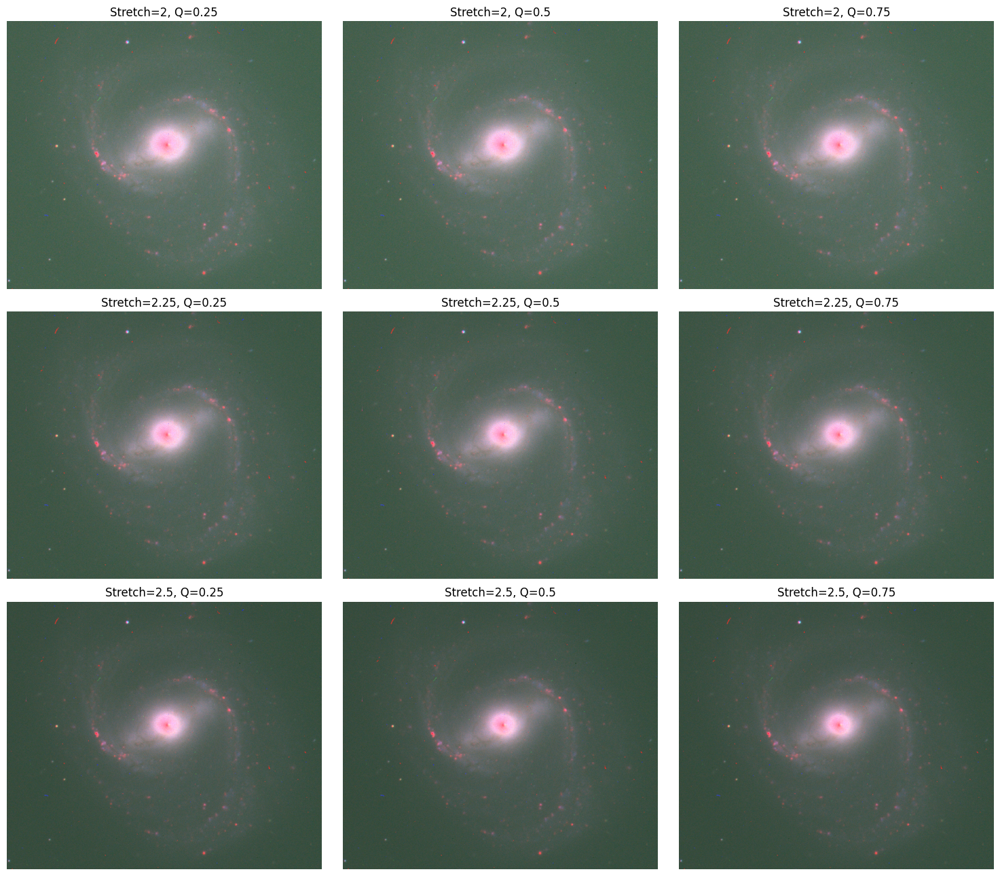

In [233]:
test_stretches = [2,2.25,2.5]
test_Qs = [0.25,0.5,0.75]

fig, axes = plt.subplots(3, 3, figsize=(15, 13))

for i, s in enumerate(test_stretches):
    for j, q in enumerate(test_Qs):

        rgb = make_lupton_rgb(Ha_scaled, V_scaled, B_scaled, stretch=s, Q=q)
        
        ax = axes[i, j]
        ax.imshow(rgb)
        ax.set_title(f"Stretch={s}, Q={q}")
        ax.axis('off')
        ax.set_xlim(500,1500)
        ax.set_ylim(400,1250)

plt.tight_layout()
plt.show()

(400.0, 1250.0)

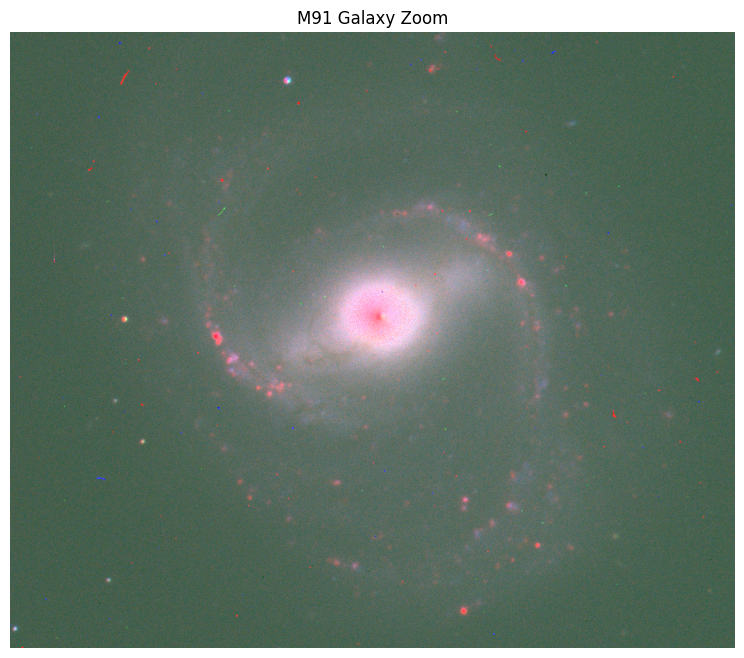

In [232]:
galaxy = make_lupton_rgb(Ha_scaled, V_scaled, B_scaled, stretch=2, Q=0.5)

plt.figure(figsize=(10,8))
plt.imshow(galaxy)
plt.title("M91 Galaxy Zoom")
plt.axis('off')
plt.xlim(500,1500)
plt.ylim(400,1250)

(-0.5, 2047.5, 2047.5, -0.5)

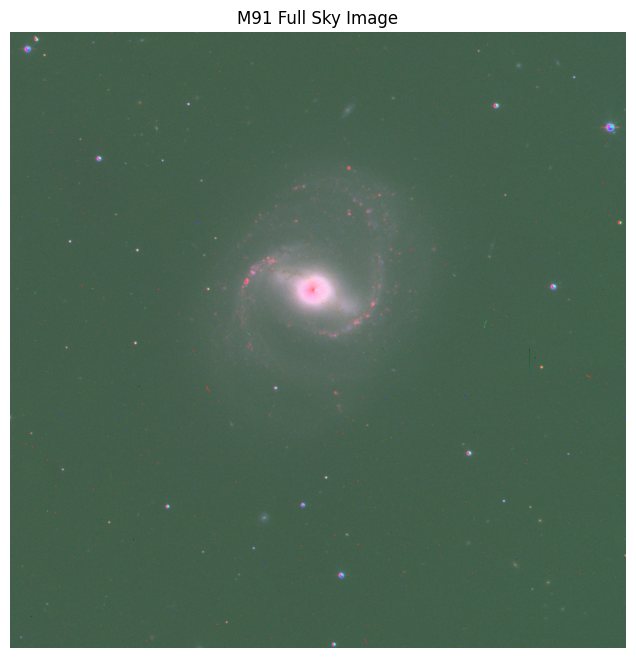

In [234]:
sky = make_lupton_rgb(Ha_scaled, V_scaled, B_scaled, stretch=2, Q=0.5)

plt.figure(figsize=(10,8))
plt.imshow(sky)
plt.title("M91 Full Sky Image")
plt.axis('off')

# NN Ser

## NN Ser Bias

In [188]:
nnser_bias = glob('Astro_analysis_data/IAC80_NN_Ser/nnser/bias/*.fits')
#print(nnser_bias)

(2048, 2098)


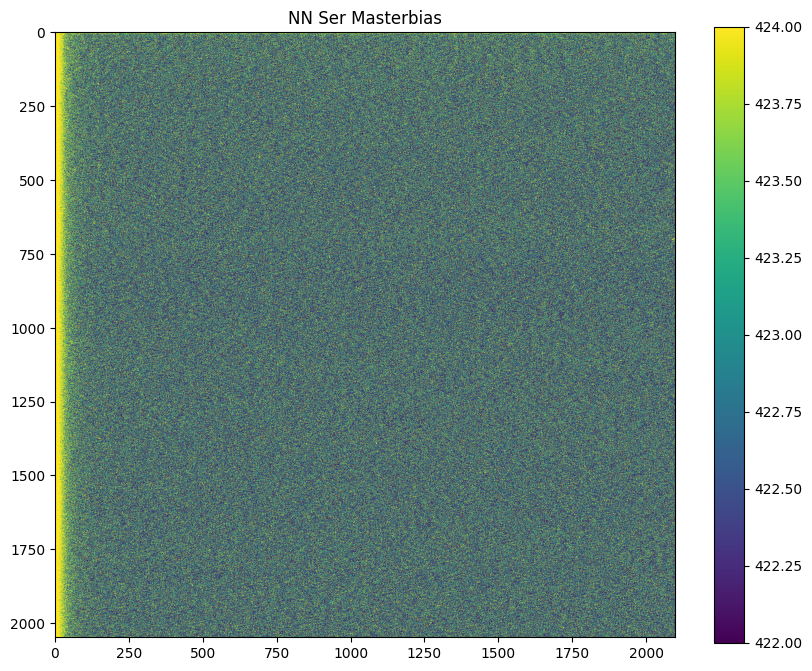

In [236]:
nnser_bias_data = np.stack([fits.getdata(f).astype(float) for f in nnser_bias], axis=0)

nnser_masterbias = np.mean(nnser_bias_data, axis=0)
print(np.shape(nnser_masterbias))

plt.figure(figsize=(10,8))
plt.imshow(nnser_masterbias, cmap='viridis', vmin=422, vmax=424)
plt.colorbar()
plt.title('NN Ser Masterbias')
plt.show()

## NN Ser Flat

In [189]:
nnser_flat = glob('Astro_analysis_data/IAC80_NN_Ser/nnser/flats/clear/*.fits')
#print(nnser_flat)

In [33]:
nnser_flat_data = []
for f in nnser_flat:
    dataf = fits.getdata(f).astype(float)
    datafb = dataf - nnser_masterbias
    nnser_flat_data.append(datafb)

nnser_flat_data = np.stack(nnser_flat_data, axis=0)
nnser_masterflat = np.mean(nnser_flat_data, axis=0)
print(np.shape(nnser_masterflat))

(2048, 2098)


1.000000098425243


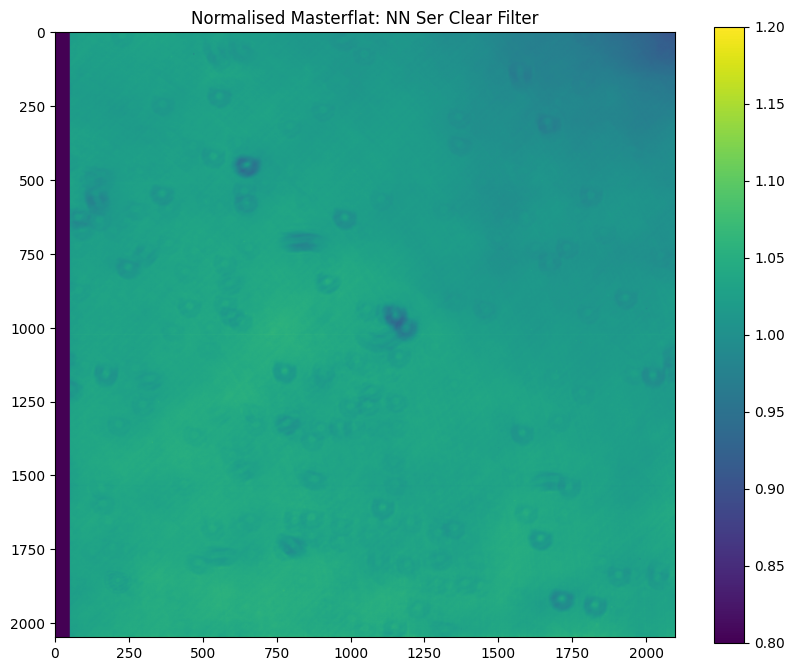

In [237]:
nnser_normalised = nnser_masterflat / np.mean(nnser_masterflat)
nnser_normalised = np.clip(nnser_normalised, 1e-6, None)
print(np.mean(nnser_normalised))

plt.figure(figsize=(10,8))
plt.imshow(nnser_normalised, cmap='viridis', vmin=0.8, vmax=1.2)
plt.colorbar()
plt.title('Normalised Masterflat: NN Ser Clear Filter')

plt.show()

## NN Ser Object

In [190]:
nnser_obj = sorted(glob('Astro_analysis_data/IAC80_NN_Ser/nnser/object/clear/*.fits'))
#print(nnser_obj)

In [36]:
def reduced_image(objfile, masterbias, normalised_flat):

    objdata = objfile[0].data.astype(float)
    reduced = ((objdata - masterbias) / normalised_flat)[:, 50:]
    
    return reduced

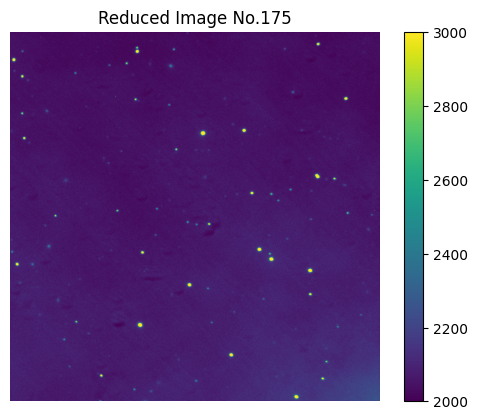

In [149]:
reduced_175 = reduced_image(fits.open(nnser_obj[0]), nnser_masterbias, nnser_normalised)

plt.imshow(reduced_175, cmap='viridis', vmin=2000, vmax=3000, origin='lower')
plt.title('Reduced Image No.175')
plt.colorbar()
plt.axis('off')
plt.show()

In [191]:
backg_175 = mad_std(reduced_175)

dao_175 = DAOStarFinder(fwhm=6., threshold=3.5*backg_175)
sources_175 = dao_175(reduced_175)

#sources_175

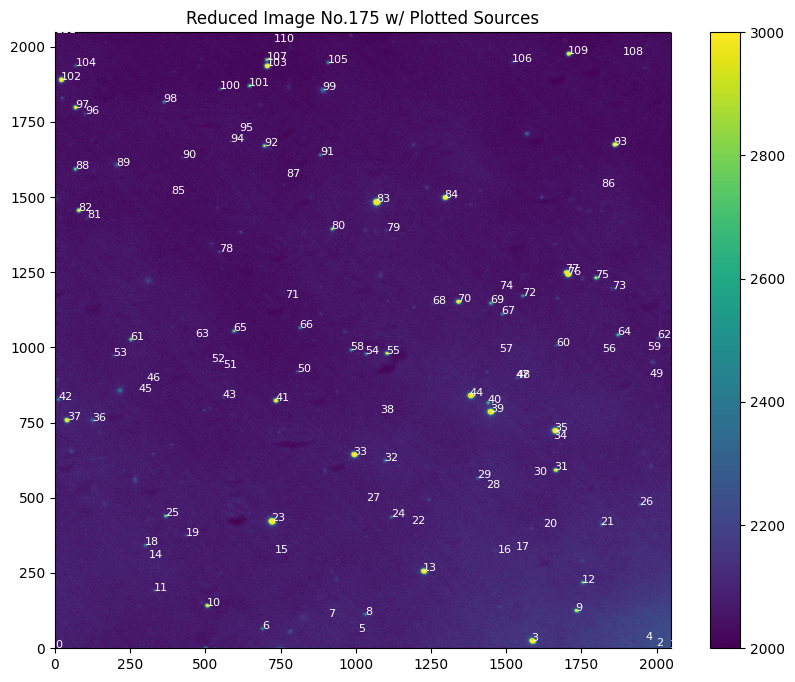

In [151]:
fig, ax = plt.subplots(figsize=(10,8))

image = ax.imshow(reduced_175, cmap='viridis', vmin=2000, vmax=3000, origin='lower')
plt.title('Reduced Image No.175 w/ Plotted Sources')
fig.colorbar(image, ax=ax)

#ax.scatter(sources_175['xcentroid'], sources_175['ycentroid'], alpha=0.3, color='orange')

for i in range(len(sources_175)):
    ax.annotate(i, (sources_175['xcentroid'][i], sources_175['ycentroid'][i]), color='white', fontsize=8)

plt.show()

#26 = D ; #40 = A ; #48 = B ; #47 = C ; #39 = NN

In [152]:
pos_175 = np.transpose((sources_175['xcentroid'], sources_175['ycentroid']))
aperture_175 = CircularAperture(pos_175, r=6.)
annulus_175 = CircularAnnulus(pos_175, r_in=10., r_out=15.)

list_apertures = [aperture_175, annulus_175]

phot_175 = aperture_photometry(reduced_175, list_apertures)

backg_mean = phot_175['aperture_sum_1'] / annulus_175.area
backg_sum = backg_mean * aperture_175.area

final_sum = phot_175['aperture_sum_0'] - backg_sum

final_sum[final_sum <= 0] = np.nan
mag_175 = -2.5 * np.log10(final_sum)

In [ ]:
ZP_A = 15.8 - mag_175[40]
ZP_B = 15.1 - mag_175[48]
ZP_C = 13.7 - mag_175[47]
ZP_D = 13.7 - mag_175[26]

print(ZP_A, ZP_B, ZP_C, ZP_D)

mean_ZP = np.mean([ZP_A, ZP_B, ZP_C, ZP_D])
ZP_NN = mag_175[39] + mean_ZP

print(ZP_NN)

27.36533339666229 25.230587058175708 23.75918889155193 24.174401260153985
10.224376392446421


In [42]:
ref_fits = fits.open(nnser_obj[0]) # 175, same as above but renamed for clarity in loop
ref_img = reduced_image(ref_fits, nnser_masterbias, nnser_normalised)
ref_fits.close()

ref_backg = mad_std(ref_img)
ref_dao = DAOStarFinder(fwhm=6., threshold=5.*ref_backg)
ref_sources = ref_dao(ref_img)

targets = {
    'A': 40,
    'B': 48,
    'C': 47,
    'D': 26,
    'NN': 39
} # storing these relative to reference image no.175

tracked_coords = {}
for name, index in targets.items():
    tracked_coords[name] = (ref_sources['xcentroid'][index], ref_sources['ycentroid'][index])

In [ ]:
NN_mag_all = []
NN_mag_err_all = []
R = 3.37 # e- (from manual)

ZP_history = {'A': [], 'B': [], 'C': []}
known_mags = {'A': 15.8, 'B': 15.1, 'C': 13.7}

plotdata = []
times = []
flag = [] # 0 = normal detection, 1 = faint detection, 2 = limit (non-detection), 3 = totally lost (no ZP)
image_id = [] # for reference in the pandas table

for i, filename in enumerate(nnser_obj):

    print(f'Image {i+175}/{len(nnser_obj)+174}')
    current_id = i +175
    image_id.append(current_id)

    with fits.open(filename) as obj:

        obj_time = obj[0].header['UT']
        reduced_obj = reduced_image(obj, nnser_masterbias, nnser_normalised)
        times.append(obj_time)

    backg_median = np.nanmedian(reduced_obj)
    backg_std = mad_std(reduced_obj)

    ref_names = ['A', 'B', 'C']
    old_refx = [tracked_coords[n][0] for n in ref_names]
    old_refy = [tracked_coords[n][1] for n in ref_names]
    
    new_refx, new_refy = centroid_sources(reduced_obj, old_refx, old_refy, box_size=11, centroid_func=centroid_com) # seraching a 11x11 box around old ref (must be odd)

    shiftx, shifty = (new_refx - old_refx), (new_refy - old_refy)
    avg_dx, avg_dy = (np.nanmedian(shiftx)), (np.nanmedian(shifty))

    if np.isnan(avg_dx) or np.abs(avg_dx) > 10: # if lost
        
        print(f'No match for {name} in image {i+175}')

        flag.append(3)
        NN_mag_all.append(np.nan)
        NN_mag_err_all.append(np.nan)
        for n in ref_names: ZP_history[n].append(np.nan)

        continue

    for index, name in enumerate(ref_names):
        tracked_coords[name] = (new_refx[index], new_refy[index])

    nn_oldx, nn_oldy = tracked_coords['NN']
    nn_newx, nn_newy = (nn_oldx + avg_dx), (nn_oldy + avg_dy)
    tracked_coords['NN'] = (nn_newx, nn_newy)

    all_names = ref_names + ['NN']
    all_x, all_y = (list(new_refx) + [nn_newx]), (list(new_refy) + [nn_newy])

    pos_obj = np.transpose((all_x, all_y))
    apert_obj = CircularAperture(pos_obj, r=6.)
    anullus_obj = CircularAnnulus(pos_obj, r_in=10., r_out=15.)

    phottable_obj = aperture_photometry(reduced_obj, [apert_obj, anullus_obj])

    # error calculations below w/ following vars:
    # F_star = total counts from source (apert sum - sky backg)
    # F_sky = annulus backg mean (avg count per px)
    # n_star = no. of px in aperture
    # n_sky = no. of px in annulus

    n_star = apert_obj.area
    n_sky = anullus_obj.area

    backg_mean_obj = phottable_obj['aperture_sum_1'] / anullus_obj.area # F_sky: avg backg count per px
    backg_sum_obj = backg_mean_obj * apert_obj.area # aka * n_star but i wrote this before realising i needed to do errors
    final_sum_obj = phottable_obj['aperture_sum_0'] - backg_sum_obj # F_star: total counts from source

    # eq 3: (F_star) / (F_star + n_star*(1 + n_star/n_sky) * (F_sky + R^2))^0.5

    sky_var = n_star * (1 + n_star/n_sky) * (backg_mean_obj + R**2) # denominator term w/o sqrt
    total_unc = np.sqrt(np.abs(final_sum_obj) + sky_var)
    SNR = final_sum_obj / total_unc

    mag_obj = np.zeros(len(final_sum_obj)) # saving in case log of neg
    mag_obj[:] = np.nan

    valid_flux = final_sum_obj > 0
    mag_obj = -2.5 * np.log10(final_sum_obj[valid_flux])
    mag_err_obj = 2.5 * np.log10(1 + (1/SNR)) # eq 4

    ZP_val = []

    for index, name in enumerate(ref_names):
        if not np.isnan(mag_obj[index]):
            ZP = known_mags[name] - mag_obj[index]
            ZP_val.append(ZP)
            ZP_history[name].append(ZP) # store for table
        else:
            ZP_history[name].append(np.nan)

    if len(ZP_val) > 0:
        mean_zp = np.nanmean(ZP_val)
        mean_zp_err = np.nanstd(ZP_val) / np.sqrt(len(ZP_val))
        
        nn_idx = 3 # (A=0, B=1, C=2, NN=4)
        nn_inst_mag = mag_obj[nn_idx]
        nn_snr = SNR[nn_idx]
        
        if nn_snr > 3: # good detection
            final_mag = nn_inst_mag + mean_zp
            final_err = np.sqrt(mag_err_obj[nn_idx]**2 + mean_zp_err**2)
            
            NN_mag_all.append(final_mag)
            NN_mag_err_all.append(final_err)
            flag.append(0) # 0 = normal
        else: # faint
            limit_flux = 3 * np.sqrt(sky_var[nn_idx])
            limit_mag = -2.5 * np.log10(limit_flux) + mean_zp
            
            NN_mag_all.append(limit_mag)
            NN_mag_err_all.append(0)
            flag.append(2) # 2 = limit
            
    else:
        NN_mag_all.append(np.nan)
        NN_mag_err_all.append(np.nan)
        flag.append(3) # no ZP

    meow = {n: (tracked_coords[n]) for n in all_names}
    plotdata.append({
        'data': reduced_obj, 
        'vmin': backg_median - backg_std, 
        'vmax': backg_median + 10*backg_std, 
        'labels': meow, 
        'title': f'Image {current_id}'
    })

print('Complete!')

table_data = {
    'Image ID': image_id,
    'Time (UT)': times,
    'NN Ser Mag': NN_mag_all,
    'NN Ser Mag Err': NN_mag_err_all,
    'Flag': flag,
}

for name in ['A', 'B', 'C']:
    table_data[f'ZP_{name}'] = ZP_history[name]

table = pd.DataFrame(table_data)

Image 175/192
Image 176/192
Image 177/192
Image 178/192
Image 179/192
Image 180/192
Image 181/192
Image 182/192
Image 183/192
Image 184/192
Image 185/192
Image 186/192
Image 187/192
Image 188/192
Image 189/192
Image 190/192
Image 191/192
Image 192/192
Complete!


In [169]:
print(table)

    Image ID     Time (UT)  NN Ser Mag  NN Ser Mag Err  Flag       ZP_A  \
0        175  02:53:45.905   17.498261        0.019189     0  29.162495   
1        176  02:55:10.873   17.516274        0.019992     0  29.171812   
2        177  02:56:36.574   17.507407        0.017005     0  29.117886   
3        178  02:58:02.653   17.527527        0.020399     0  29.010348   
4        179  03:00:52.123   17.519559        0.017291     0  29.661165   
5        180  03:02:48.093   17.754714        0.019082     0  29.672502   
6        181  03:04:43.753   21.399366        0.000000     2  29.633390   
7        182  03:06:39.454   21.342517        0.000000     2  29.560110   
8        183  03:08:35.049   21.293964        0.000000     2  29.531914   
9        184  03:10:30.831   21.431743        0.000000     2  29.660698   
10       185  03:12:26.645   18.790502        0.035263     0  29.636887   
11       186  03:14:22.685   17.515266        0.017880     0  29.613666   
12       187  03:16:18.61

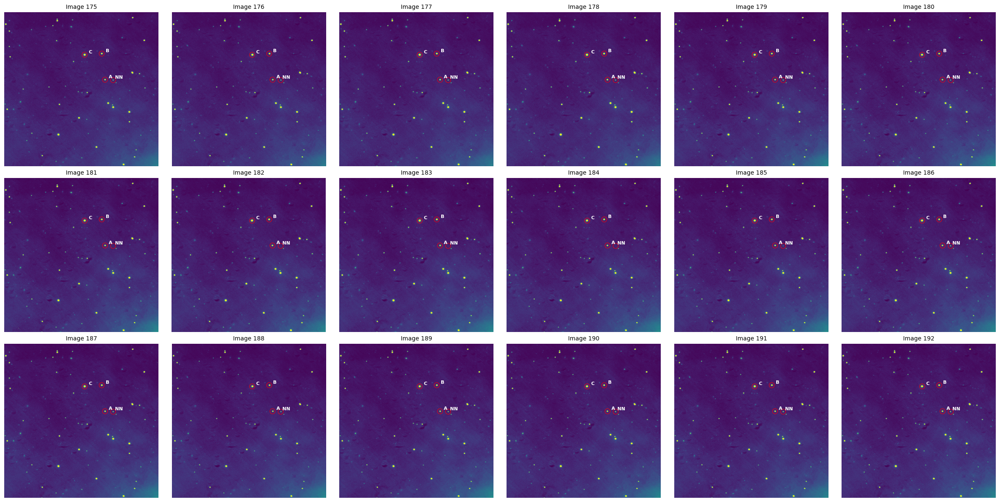

In [241]:
fig, axes = plt.subplots(3, 6, figsize=(24, 12))
axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < len(plotdata):
        p = plotdata[i]
        
        im = ax.imshow(p['data'], cmap='viridis', origin='lower', 
                       vmin=p['vmin'], vmax=p['vmax'])
        
        ax.set_title(p['title'], fontsize=10)
        ax.axis('off')

        for name, (x, y) in p['labels'].items():
            ax.scatter(x, y, s=80, facecolors='none', edgecolors='red', alpha=0.7)
            ax.text(x+75, y+20, name, color='white', fontsize=8, ha='center', fontweight='bold')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

# hi morgan if you're reading this i hope you liked my effort

<Figure size 1000x600 with 0 Axes>

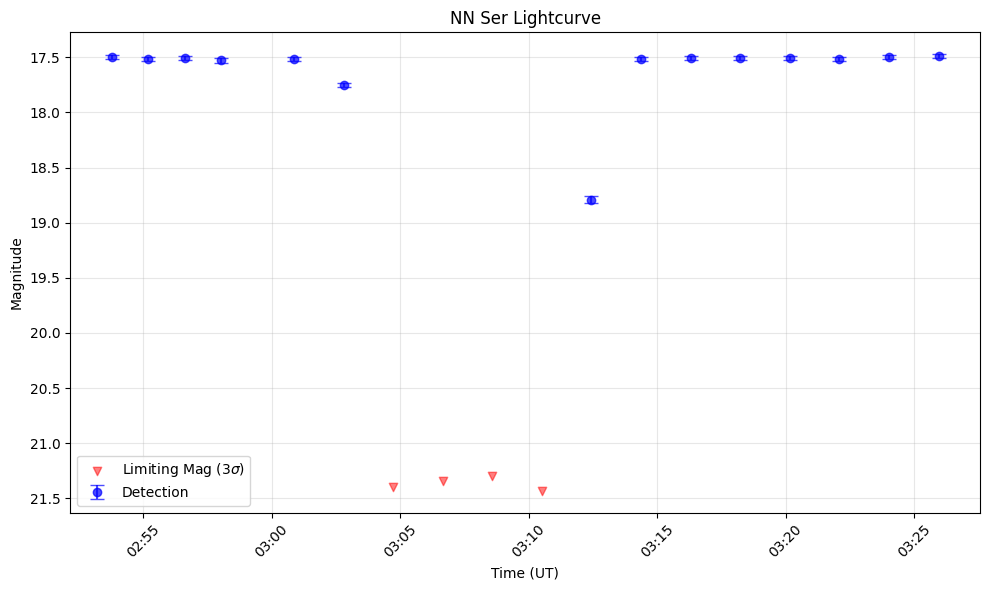

In [174]:
mags = np.array(NN_mag_all)
flags = np.array(flag)
t = np.array(times)
errs = np.array(NN_mag_err_all)

t = pd.to_datetime(t, format='%H:%M:%S.%f') # convert text strings to real datetime objects

plt.figure(figsize=(10,6))

mask = (mags > 14) | np.isnan(mags)

mags, flags, t = mags[mask], flags[mask], t[mask]

plt.figure(figsize=(10,6))

det_mask = (flags <= 1)
plt.errorbar(t[det_mask], mags[det_mask], yerr=errs[det_mask], fmt='o', c='blue', label='Detection', capsize=5, alpha=0.7)

limit_mask = (flags == 2)
plt.scatter(t[limit_mask], mags[limit_mask], c='red', marker='v', alpha=0.5, label='Limiting Mag (3$\sigma$)')

plt.gca().invert_yaxis()
plt.xlabel('Time (UT)')
plt.ylabel('Magnitude')
plt.title('NN Ser Lightcurve')

myFmt = mdates.DateFormatter('%H:%M')
plt.gca().xaxis.set_major_formatter(myFmt)
plt.xticks(rotation=45)

plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

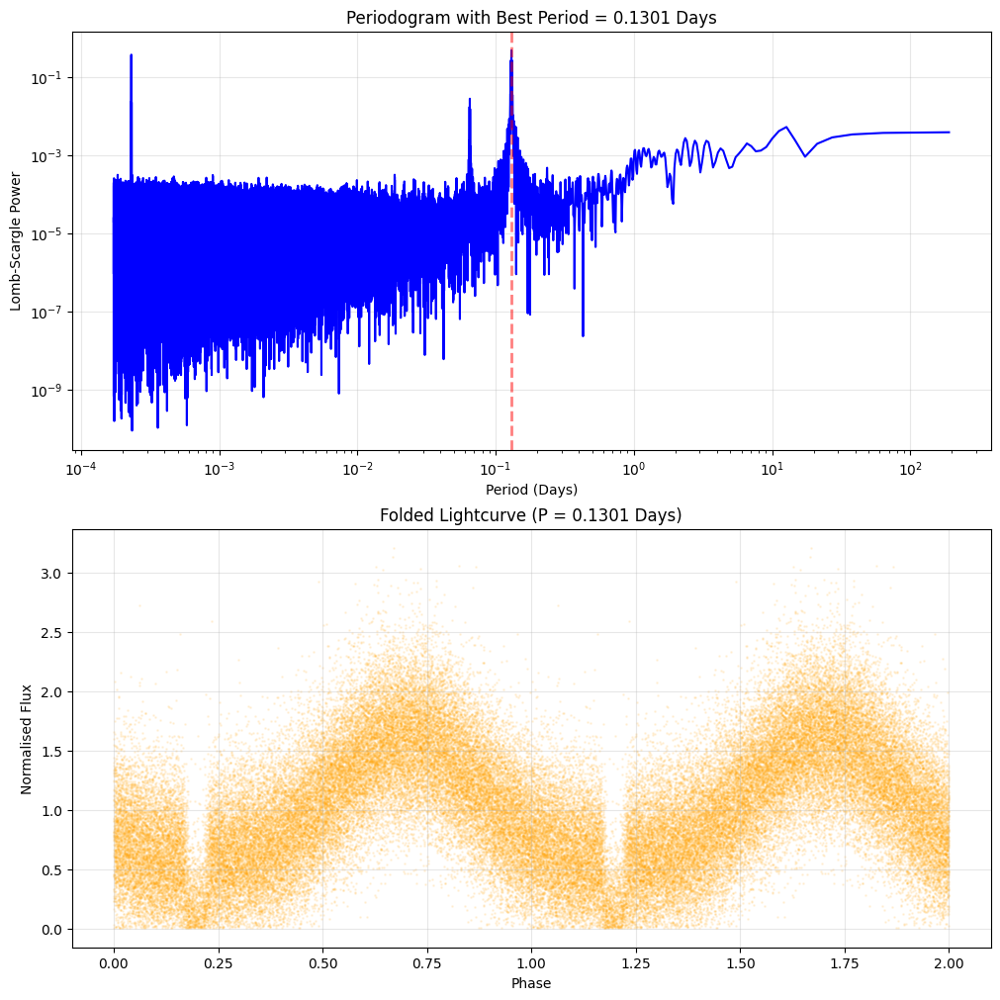

In [239]:
tess = pd.read_csv('Astro_analysis_data/NN_Ser_TESS.csv')

tess.columns = tess.columns.str.strip().str.lower()
time = pd.to_numeric(tess['time'], errors='coerce').values
flux = pd.to_numeric(tess['flux'], errors='coerce').values
fluxerr = pd.to_numeric(tess['flux_err'], errors='coerce').values

mask = (flux > 0) & (np.isfinite(time)) & (np.isfinite(flux)) & (np.isfinite(fluxerr))
time, flux, fluxerr = time[mask], flux[mask], fluxerr[mask]

flux_norm = flux / np.median(flux)

frequency, power = LombScargle(time, flux_norm).autopower()

best_freq = frequency[np.argmax(power)]
best_period = 1 / best_freq

t0 = time[np.argmin(flux_norm)]
phase = ((time - t0) / best_period) % 1

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,10), constrained_layout=True)

# periodogram plot
ax1.plot(1/frequency, power, color='blue')
ax1.set_xlabel('Period (Days)')
ax1.set_ylabel('Lomb-Scargle Power')
ax1.set_title(f'Periodogram with Best Period = {best_period:.4f} Days')
ax1.axvline(best_period, color='red', linestyle='--', alpha=0.5, linewidth=2)
ax1.grid('True', alpha=0.3)
ax1.loglog()

# phase-folded lightcurve
ax2.scatter(phase, flux_norm, color='orange', s=1, alpha=0.1, label='TESS Data')
ax2.scatter(phase + 1, flux_norm, color='orange', s=1, alpha=0.1)
ax2.set_xlabel('Phase')
ax2.set_ylabel('Normalised Flux')
ax2.set_title(f'Folded Lightcurve (P = {best_period:.4f} Days)')
ax2.grid('True', alpha=0.3)

plt.show()